# Objective

The original code implementation for `get_bs_geometry` assumes the BS is above the CF pointing down at it, which is an assumption we're now breaking. The code which actually estimates the BS geometries is found within`crazyflie-lib-python/cflib/localization/lighthouse_bs_geo.py`. In this notebook, we'll go through each of the functions which are involved in estimating the pose of the BS, and try and update them to allow for a CF flipped on its side, and base stations on both the floor and ceiling. These are:

1. `_find_initial_yaw_guess` estimates yaw of the CF based on sensor order mappings
2. `_convert_yaw_to_open_cv` converts the yaw to a guess of the CF pose in the BS reference frame (but a "camera" version of the BS reference frame)
3. `_estimate_pose_by_pnp(bs_vectors, rvec_guess, tvec_guess)` uses the CF pose guess and the sensor data to solve for the actual CF pose in the BS camera reference frame, then converts that into the BS position in the world reference frame (oriented around the CF)
4. `_opencv_to_cf(rw_ocv, tw_ocv)` converts the axes of the solved pose in the world reference to the official CF reference frame axes

In this notebook we'll cover (1)

# Helper functions

In [11]:
def hash_sensor_order(order):
    hash = 0
    for i in range(4):
        hash += order[i] * 4 ** i
    return hash

# Data

Test data is from a variety of CF positions, shown in this image:

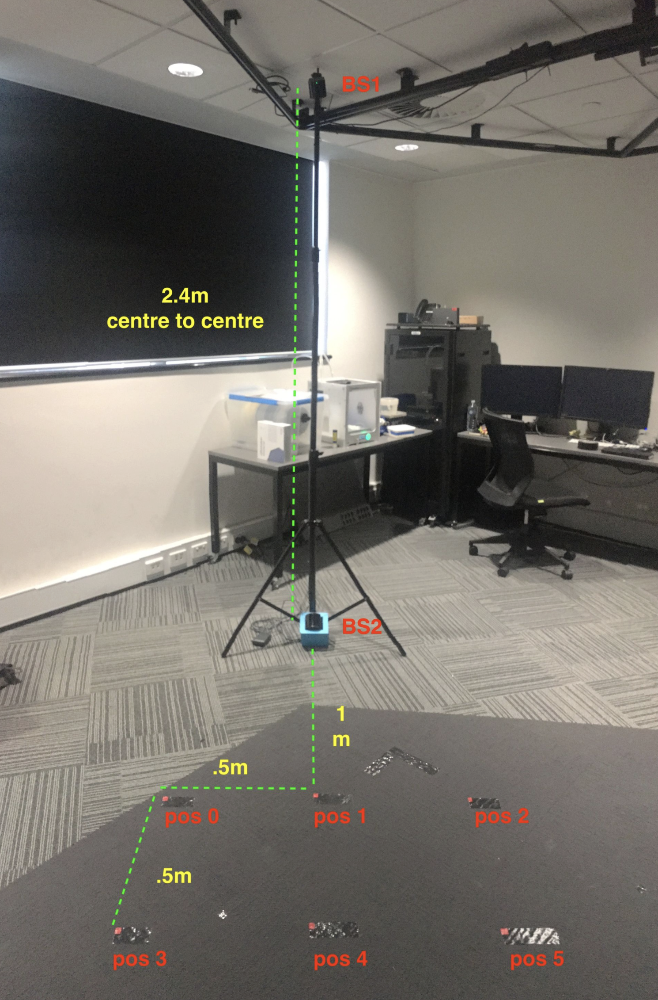

In [12]:
import pickle
import collections

sensor_data = {
    "sideways": [
        pickle.load(open("sensor_data_pos_0_sideways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_1_sideways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_2_sideways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_3_sideways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_4_sideways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_5_sideways.pickle", "rb")),
    ],
    "upways": [
        pickle.load(open("sensor_data_pos_0_upways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_1_upways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_2_upways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_3_upways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_4_upways.pickle", "rb")),
        pickle.load(open("sensor_data_pos_5_upways.pickle", "rb")),
    ],
}

## (1) Update `find_initial_yaw_guess`

The lighthouse deck which is mounted on the CF looks like this:

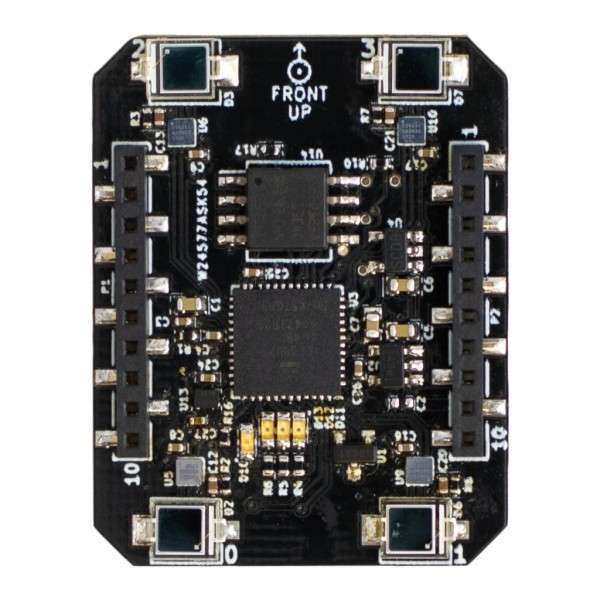

I'm assuming the numbers on the edges correspond to the sensor IDs during operation.

The pre-set yaw angle to sensor order mapping in the original code is as follows (this assumes the BS is above the CF pointing down at it)

In [13]:
import math

# Numbers passed to math.radians are angles
directions = {
    hash_sensor_order([2, 0, 1, 3]): math.radians(0),
    hash_sensor_order([2, 0, 3, 1]): math.radians(25),
    hash_sensor_order([2, 3, 0, 1]): math.radians(65),
    hash_sensor_order([3, 2, 0, 1]): math.radians(90),
    hash_sensor_order([3, 2, 1, 0]): math.radians(115),
    hash_sensor_order([3, 1, 2, 0]): math.radians(155),
    hash_sensor_order([1, 3, 2, 0]): math.radians(180),
    hash_sensor_order([1, 3, 0, 2]): math.radians(205),
    hash_sensor_order([1, 0, 3, 2]): math.radians(245),
    hash_sensor_order([0, 1, 3, 2]): math.radians(270),
    hash_sensor_order([0, 1, 2, 3]): math.radians(295),
    hash_sensor_order([0, 2, 1, 3]): math.radians(335),
}

If you imagine a CF with a lighthouse deck on top, with sensors numbered as in the picture above, the degree values in this map make sense for the different sensor orders (to intuit this better I labelled the corners of a piece of paper with the sensor numbers and rotated it around, imagining I was a base station doing horizontal scans).

In order to have both an up-sensor and down-sensor BS be in "view", the CF needs to be turned on its side:

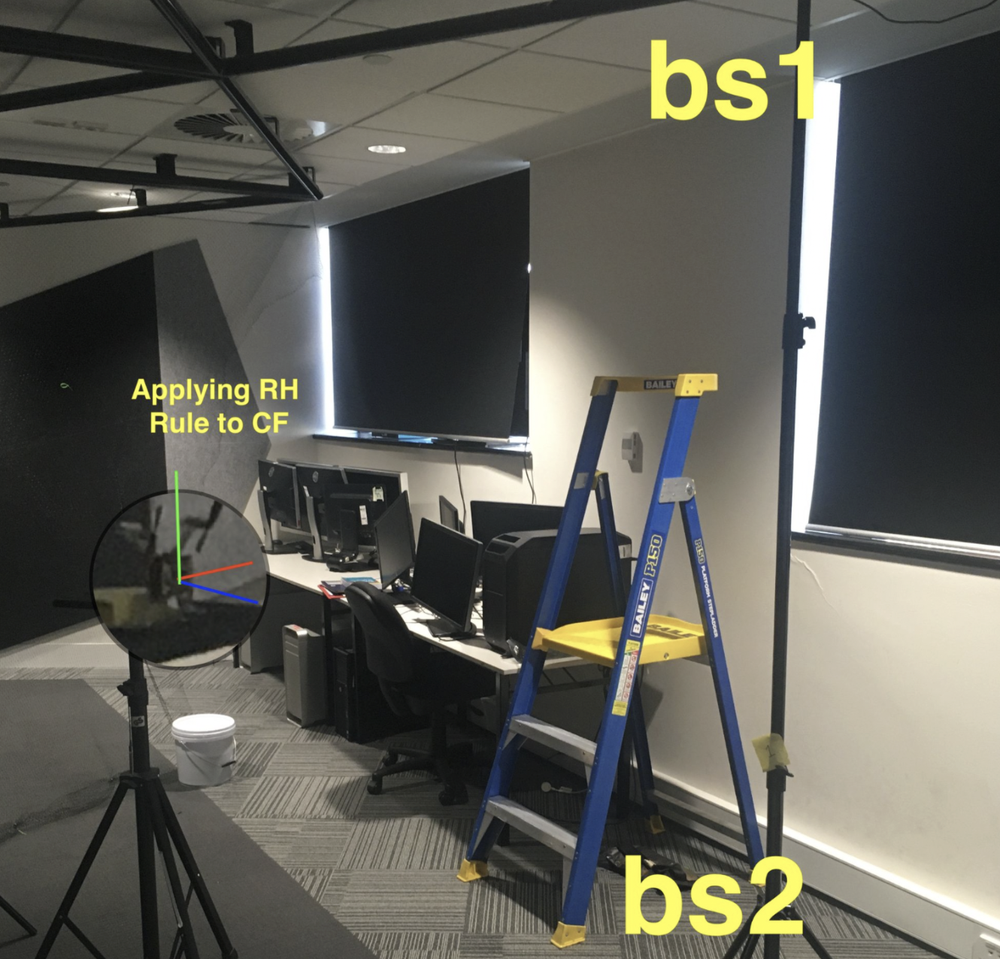

In this configuration, we instead want to find the "pitch" of the CF, rather than the yaw, which is the equivalent angle with the CF flipped on its side. To do this, we need to do things a little differently, as no matter what pitch angle the CF is at, sensors (0 and 2) and (1 and 3) will be always be hit at the same time by the vertical sweep, and sensors (2 and 3) and (0 and 1) will always be hit at the same time by the horizontal sweep. 

There's probably a few ways to to do this. Here's my proposal (pitch, if you will)

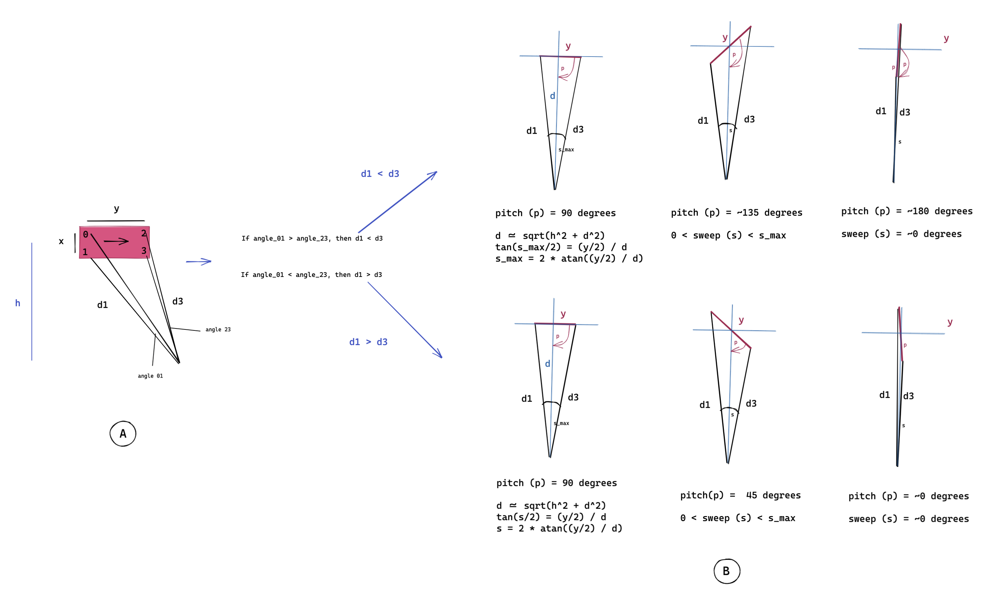


Note that this assumes the CF is flipped on its side with the Y-axis facing up, and is reasonably sensitive to the distance between the BS and CF, so making sure the CF is set up about 3 meters away from the BS' is important. Going through the steps in the diagram above:


- (A) `x` and `y` are known, as physical constants of the CF lighthouse deck, `d1` is the distance from the BS to sensor 1, `d3` is the distance from the BS to sensors 2 and 3. As we know the angle difference between sensors 0 and 1 (and 2 and 3) from our vertical sweep data, we can therefore calculate which of `d1` or `d3` is bigger, which gives us a 90 degree range that our 
- (B) Now, if we assume that we roughly know the distance from the BS to the CF (using height `h` and distance along foor `d`), we can calculate what the sweep angle should be for a 90 degree pitch. We also know that the pitch angle angle should be either 180 or 0 for a 0 degree pitch. We can use this knowledge to infer a mapping between pitch and sweep angle (where at run-time we'll be solving for pitch based on sweep angle)

Let's check our assumptions here using the data we have:

In [14]:
# First lets check angles on positions 0 through 2

print()
print("This is the horizontal sweep angle for sensor 0 from BS2 for positions 0, 1, 2 - should be ascending")
print(sensor_data["sideways"][0][2][1][0].lh_v1_horiz_angle)
print(sensor_data["sideways"][1][2][1][0].lh_v1_horiz_angle)
print(sensor_data["sideways"][2][2][1][0].lh_v1_horiz_angle)

print()
print("For position 0, the horizontal sweep angle to sensor 3 should be lower than that to sensor 1")
print("3:")
print(sensor_data["sideways"][0][2][1][3].lh_v1_horiz_angle)
print("1:")
print(sensor_data["sideways"][0][2][1][1].lh_v1_horiz_angle)

print()
print("This is the horizontal sweep angle for sensor 0 and sensor 1 from BS2 in position 1 - should be roughly the same")
print(sensor_data["sideways"][1][2][1][0].lh_v1_horiz_angle)
print(sensor_data["sideways"][1][2][1][1].lh_v1_horiz_angle)

print()
print("This is the vertical sweep angle for sensor 0 and sensor 1 from BS2 in position 1 - 0 should be greater than 1")
print(sensor_data["sideways"][1][2][1][0].lh_v1_vert_angle)
print(sensor_data["sideways"][1][2][1][1].lh_v1_vert_angle)

print()
print("And 2 should be greater than 3")
print(sensor_data["sideways"][1][2][1][2].lh_v1_vert_angle)
print(sensor_data["sideways"][1][2][1][3].lh_v1_vert_angle)

print()
print("For position 0, the vertical angle between sensors 2 and 3 should be smaller than that between 0 and 1")
print("2 and 3:")
print(sensor_data["sideways"][1][2][1][2].lh_v1_vert_angle - sensor_data["sideways"][1][2][1][3].lh_v1_vert_angle)
print("0 and 1:")
print(sensor_data["sideways"][1][2][1][0].lh_v1_vert_angle - sensor_data["sideways"][1][2][1][1].lh_v1_vert_angle)

print()
print("This is the horizontal sweep angle for sensor 1 and sensor 3 from BS2 in position 1 - 1 should be greater than 3")
print(sensor_data["sideways"][1][2][1][1].lh_v1_horiz_angle)
print(sensor_data["sideways"][1][2][1][3].lh_v1_horiz_angle)

print()
print("The horizontal sweep angle between sensor 1 and 3 in degrees:")
print(math.degrees(
    sensor_data["sideways"][1][2][1][1].lh_v1_horiz_angle - 
    sensor_data["sideways"][1][2][1][3].lh_v1_horiz_angle
))

print()
print("Should be roughly the same for BS1:")
print(math.degrees(
    sensor_data["sideways"][1][1][1][1].lh_v1_horiz_angle - 
    sensor_data["sideways"][1][1][1][3].lh_v1_horiz_angle
))

print()
print("For BS2 and position 1, the sweep angle we'd predict between sensor 1 and 3 if pitch was 90 degrees (approximate actual pitch)")
sensor_distance_length = 0.03
horiz_dist = 1
vert_dist = 1.2
dist = math.sqrt(horiz_dist**2 + vert_dist**2)
max_sweep = 2 * math.atan((sensor_distance_length / 2) / dist)
print(math.degrees(max_sweep))

print()
print("Doing the same for BS2 and position 4 - the sweep angle between sensor 1 and 3 in degrees, and then what we'd predict")
print(math.degrees(
    sensor_data["sideways"][4][2][1][1].lh_v1_horiz_angle - 
    sensor_data["sideways"][4][2][1][3].lh_v1_horiz_angle
))

sensor_distance_length = 0.03
horiz_dist = 1.5
vert_dist = 1.2
dist = math.sqrt(horiz_dist**2 + vert_dist**2)
max_sweep = 2 * math.atan((sensor_distance_length / 2) / dist)
print(math.degrees(max_sweep))

print()
print("Using a system based on the max sweep angle to determine the degrees of each position")

sensor_distance_length = 0.03
horiz_dist = 1.25
vert_dist = 1.2
dist = math.sqrt(horiz_dist**2 + vert_dist**2)
max_sweep = 2 * math.atan((sensor_distance_length / 2) / dist)
      
for i, position in enumerate(sensor_data["sideways"]):

    print(f"-------- Position {i} ----------")
    for bs_id, data in position.items():
        
        print(f" --- BS {bs_id} ---")
        bs_vectors = data[1]
                
        sweep_angle_01 = math.fabs(bs_vectors[0].lh_v1_vert_angle - bs_vectors[1].lh_v1_vert_angle)
        sweep_angle_23 = math.fabs(bs_vectors[2].lh_v1_vert_angle - bs_vectors[3].lh_v1_vert_angle)
        sweep_angle_31 = math.fabs(bs_vectors[1].lh_v1_horiz_angle - bs_vectors[3].lh_v1_horiz_angle)
        
        if sweep_angle_01 < sweep_angle_23:
            
            print("Front closer")
            print(f"sweep angle 31: {sweep_angle_31}")
             
            if sweep_angle_31 < 0.5 * max_sweep:
                print("0 degrees")
                
            elif sweep_angle_31 < 0.75 * max_sweep:
                print("25 degrees")
            
            elif sweep_angle_31 < 0.95 * max_sweep:
                print("65 degrees")
                
            else:
                print("85 degrees")
                                   
        else:
            
            print("Front further away")
            print(f"sweep angle 31: {sweep_angle_31}")
                        
            if sweep_angle_31 < 0.5 * max_sweep:
                print("180 degrees")
                
            elif sweep_angle_31 < 0.75 * max_sweep:
                print("155 degrees")
            
            elif sweep_angle_31 < 0.95 * max_sweep:
                print("115 degrees")
                
            else:
                print("95 degrees")



This is the horizontal sweep angle for sensor 0 from BS2 for positions 0, 1, 2 - should be ascending
-0.11211138218641281
0.18466303408145904
0.4913734458386898

For position 0, the horizontal sweep angle to sensor 3 should be lower than that to sensor 1
3:
-0.13158861607313155
1:
-0.11457560032606125

This is the horizontal sweep angle for sensor 0 and sensor 1 from BS2 in position 1 - should be roughly the same
0.18466303408145904
0.1844720321893692

This is the vertical sweep angle for sensor 0 and sensor 1 from BS2 in position 1 - 0 should be greater than 1
-0.18319484561681748
-0.18930293887853622

And 2 should be greater than 3
-0.18360039085149765
-0.18964298099279403

For position 0, the vertical angle between sensors 2 and 3 should be smaller than that between 0 and 1
2 and 3:
0.006042590141296378
0 and 1:
0.006108093261718739

This is the horizontal sweep angle for sensor 1 and sensor 3 from BS2 in position 1 - 1 should be greater than 3
0.1844720321893692
0.1659197479486465

This all seems reasonable - it's a bit weird that for position 2 the front is seen as further away than the back, but the results aren't super far off. Reference these angles to the picture for BS 2:

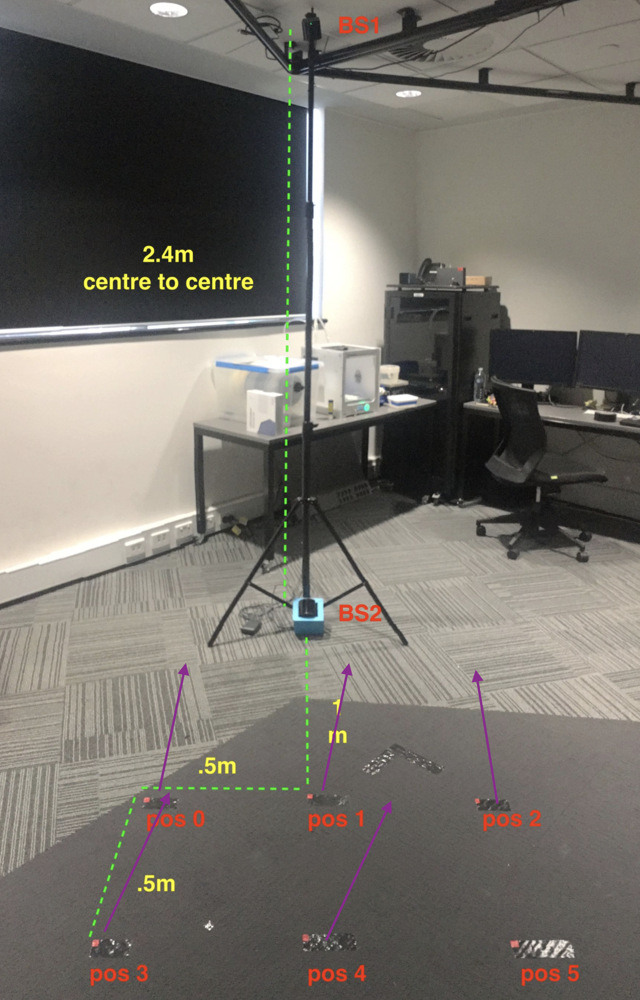

Putting this into the code:

In [15]:
import math

# Numbers passed to math.radians are angles

# Turning right is positive yaw
yaw_directions = {
    hash_sensor_order([2, 0, 1, 3]): math.radians(0),
    hash_sensor_order([2, 0, 3, 1]): math.radians(25),
    hash_sensor_order([2, 3, 0, 1]): math.radians(65),
    hash_sensor_order([3, 2, 0, 1]): math.radians(90),
    hash_sensor_order([3, 2, 1, 0]): math.radians(115),
    hash_sensor_order([3, 1, 2, 0]): math.radians(155),
    hash_sensor_order([1, 3, 2, 0]): math.radians(180),
    hash_sensor_order([1, 3, 0, 2]): math.radians(205),
    hash_sensor_order([1, 0, 3, 2]): math.radians(245),
    hash_sensor_order([0, 1, 3, 2]): math.radians(270),
    hash_sensor_order([0, 1, 2, 3]): math.radians(295),
    hash_sensor_order([0, 2, 1, 3]): math.radians(335),
}

sensor_distance_width = 0.015
sensor_distance_length = 0.03
horiz_dist = 1.25
vert_dist = 1.2
dist = math.sqrt(horiz_dist**2 + vert_dist**2)
max_sweep = 2 * math.atan((sensor_distance_length / 2) / dist)


def find_initial_yaw_or_pitch_guess(bs_vectors, sideways):
   
    if sideways:
        
        # Use sweep angles
        
        # Assumes distance along floor between CF and BS is 3, and relative height is 1 
        # (straight dist 3.16)
        
        # Vertical angles
        sweep_angle_01 = math.fabs(bs_vectors[0].lh_v1_vert_angle - bs_vectors[1].lh_v1_vert_angle)
        sweep_angle_23 = math.fabs(bs_vectors[2].lh_v1_vert_angle - bs_vectors[3].lh_v1_vert_angle)
        
        # Horizontal angles
        sweep_angle_31 = math.fabs(bs_vectors[1].lh_v1_horiz_angle - bs_vectors[3].lh_v1_horiz_angle)
                        
        # TODO I may need to make the returned pitch angles negative
        
        # Just use a bunch of if statements while testing this approach
        
        if sweep_angle_01 < sweep_angle_23:

            # Front closer
             
            if sweep_angle_31 < 0.5 * max_sweep:
                return math.radians(0)
                
            elif sweep_angle_31 < 0.75 * max_sweep:
                return math.radians(25)
            
            elif sweep_angle_31 < 0.95 * max_sweep:
                return math.radians(65)
                
            else:
                return math.radians(85)
                                   
        else:

            # Front further away
                        
            if sweep_angle_31 < 0.5 * max_sweep:
                return math.radians(180)
                
            elif sweep_angle_31 < 0.75 * max_sweep:
                return math.radians(155)
            
            elif sweep_angle_31 < 0.95 * max_sweep:
                return math.radians(115)
                
            else:
                return math.radians(95)    
            
        
    else:
        
        # Normal approach - use horizontal sweeps and pre-set yaw map
    
        sweeps_x = {
            0: bs_vectors[0].lh_v1_horiz_angle,
            1: bs_vectors[1].lh_v1_horiz_angle,
            2: bs_vectors[2].lh_v1_horiz_angle,
            3: bs_vectors[3].lh_v1_horiz_angle
        }

        ordered_map_x = {k: v for k, v in
                         sorted(sweeps_x.items(), key=lambda item: item[1])}
        sensor_order_x = list(ordered_map_x.keys())
        
        # The base station is roughly in this yaw direction, in CF (world) coordinates
        return yaw_directions[hash_sensor_order(sensor_order_x)]
    